<a href="https://colab.research.google.com/github/furlancad/Canal-Codigo-Quant/blob/main/%5BYT%5D_Fontes_de_Dados.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

### Configuração Inicial

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from itertools import combinations

import IPython
import cufflinks as cf
cf.go_offline()
#cf.getThemes()

## plotly
import plotly

# configurando o plotly para rodar adequadamento no google colab junto com cufflinks
plotly.io.renderers.default = 'colab'

### 1. Obtenção dos Dados

In [2]:
ativos = ['itub4','petr4','vale3','wege3']
fontes = ['alpha', 'investing', 'yahoo', 'tview', 'bloomberg', 'reuters', 'economatica', 'google']

In [3]:
path = "https://github.com/codigoquant/data/raw/main/"

In [4]:
precos   = {ativo:pd.read_csv(f"{path}/{ativo}.csv", index_col=0, parse_dates=True) for ativo in ativos}
retornos = {ativo:precos[ativo].pct_change() for ativo in ativos}

<ipython-input-4-49f694f99631>:2: FutureWarning:

The default fill_method='pad' in DataFrame.pct_change is deprecated and will be removed in a future version. Either fill in any non-leading NA values prior to calling pct_change or specify 'fill_method=None' to not fill NA values.



## 2. Análise exploratória dos dados

In [5]:
[(precos[ativo].isnull()*1).iplot(title=f"{ativo.upper()} - Dados faltantes", subplots=True, theme="solar", kind="bar" ) for ativo in ativos];

In [6]:
precos["itub4"]["2017-12-27":]

,alpha,investing,yahoo,tview,bloomberg,reuters,economatica,google
Date,,,,,,,,
2017-12-27,27.2749,23.21,24.208517,22.448640,28.313,23.073535,23.063593,28.31
2017-12-28,27.3457,23.27,24.271227,22.506783,28.313,23.133297,23.123330,28.39
2017-12-29,NaN,NaN,24.271227,NaN,28.313,NaN,NaN,NaN
2018-01-02,28.1901,23.99,25.021057,23.202099,29.253,23.847969,23.837700,35.01
2018-01-03,28.3828,24.15,25.192122,23.360728,29.453,24.011013,24.000674,34.07
...,...,...,...,...,...,...,...,...
2021-09-03,29.7700,29.77,29.770000,29.770000,29.770,29.770000,29.770000,27.12
2021-09-06,30.1500,30.15,30.150000,30.150000,29.770,30.150000,30.150000,33.26
2021-09-08,28.7200,28.72,28.719999,28.719999,28.720,28.720000,28.720000,31.20


In [7]:
[precos[ativo].iplot( title=f"{ativo.upper()} - Preço de Fechamento Ajustado" , theme='solar') for ativo in ativos];

In [8]:
[retornos[ativo].iplot( title=f"{ativo.upper()} - Retorno Diário" , theme='solar', subplots=True) for ativo in ativos];

## 3. Análise Estatística

In [9]:
[retornos[ativo].iplot(title=f"{ativo.upper()} - Box Retorno Diário" , theme='solar', kind='box') for ativo in ativos];

In [10]:
[retornos[ativo].iplot(title=f"{ativo.upper()} - Histrograma de Retornos" , theme='solar', subplots=True, kind='histogram') for ativo in ativos];

In [11]:
[display(IPython.display.HTML(f"<h3>{ativo.upper()}</h3>"), retornos[ativo].describe()) for ativo in ativos];

,alpha,investing,yahoo,tview,bloomberg,reuters,economatica,google
count,4137.000000,4137.000000,4137.000000,4137.000000,4137.000000,4137.000000,4137.000000,3135.000000
mean,0.000633,0.000744,0.000715,0.000937,0.000608,0.000745,0.000762,0.002976
std,0.022706,0.022590,0.022581,0.022948,0.022754,0.022575,0.022575,0.074902
min,-0.121409,-0.122414,-0.121399,-0.121286,-0.127690,-0.121399,-0.121399,-0.498435
25%,-0.011869,-0.011829,-0.011795,-0.011830,-0.011554,-0.011827,-0.011795,-0.012807
50%,0.000000,0.000000,0.000000,0.000122,0.000000,0.000000,0.000000,0.000000
75%,0.012050,0.012211,0.012049,0.012463,0.011758,0.012208,0.012209,0.013600
max,0.233740,0.234432,0.233726,0.233713,0.233773,0.233727,0.233727,0.963131


,alpha,investing,yahoo,tview,bloomberg,reuters,economatica,google
count,4120.000000,4120.000000,4120.000000,4120.000000,4120.000000,4120.000000,4120.000000,3867.000000
mean,0.000713,0.000672,0.000716,0.000786,0.000604,0.000701,0.000733,0.007048
std,0.028557,0.028592,0.028553,0.028577,0.028788,0.028557,0.028566,0.122409
min,-0.296977,-0.296978,-0.296978,-0.296978,-0.296978,-0.296978,-0.296978,-0.711308
25%,-0.013817,-0.013759,-0.013764,-0.013672,-0.013114,-0.013814,-0.013794,-0.016141
50%,0.000859,0.000821,0.000547,0.000893,0.000000,0.000864,0.000888,0.000000
75%,0.014627,0.014559,0.014376,0.014676,0.013989,0.014626,0.014660,0.017556
max,0.222221,0.222222,0.222222,0.222222,0.222222,0.222222,0.222222,1.519273


,alpha,investing,yahoo,tview,bloomberg,reuters,economatica,google
count,4141.000000,4141.000000,4141.000000,4141.000000,4141.000000,4141.000000,4141.000000,4141.000000
mean,0.000895,0.000843,0.000888,0.001043,0.000761,0.000897,0.000917,0.013206
std,0.027060,0.027251,0.027110,0.027178,0.027186,0.027077,0.027078,0.206426
min,-0.245236,-0.245287,-0.245592,-0.245236,-0.238455,-0.245236,-0.245236,-0.790075
25%,-0.013566,-0.013684,-0.013566,-0.013552,-0.012987,-0.013566,-0.013559,-0.016008
50%,0.000204,0.000197,0.000000,0.000290,0.000000,0.000226,0.000251,0.000000
75%,0.014460,0.014455,0.014501,0.014655,0.013962,0.014469,0.014501,0.017660
max,0.213577,0.213675,0.213579,0.213579,0.213579,0.213579,0.213579,3.594181


,alpha,investing,yahoo,tview,bloomberg,reuters,economatica,google
count,3603.000000,3603.000000,3604.000000,3604.000000,3604.000000,3603.000000,3603.000000,3601.000000
mean,0.001382,0.001353,0.001329,0.001321,0.001252,0.001354,0.001376,0.005741
std,0.024658,0.024623,0.023226,0.022635,0.022484,0.024628,0.024671,0.101759
min,-0.279994,-0.278810,-0.206197,-0.206198,-0.206198,-0.280000,-0.280000,-0.556903
25%,-0.010115,-0.010101,-0.010208,-0.010178,-0.009659,-0.010092,-0.010092,-0.011507
50%,0.000359,0.000000,0.000426,0.000531,0.000000,0.000408,0.000426,0.000000
75%,0.012136,0.012394,0.012196,0.012228,0.011726,0.012143,0.012143,0.015936
max,0.388877,0.386598,0.285714,0.206186,0.206132,0.388889,0.388889,1.781955


## 4. Análise comparativa

In [12]:
# Removendo o Google do comparativo devido à baixa qualidade dos dados
fontes.remove('google')

for ativo in ativos:
  precos[ativo].drop('google', axis=1, inplace=True)
  retornos[ativo].drop('google', axis=1, inplace=True)

### 4.1 Correlação entre Retornos

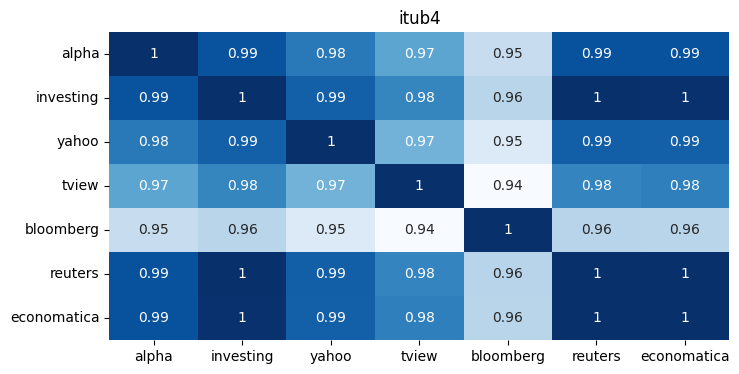

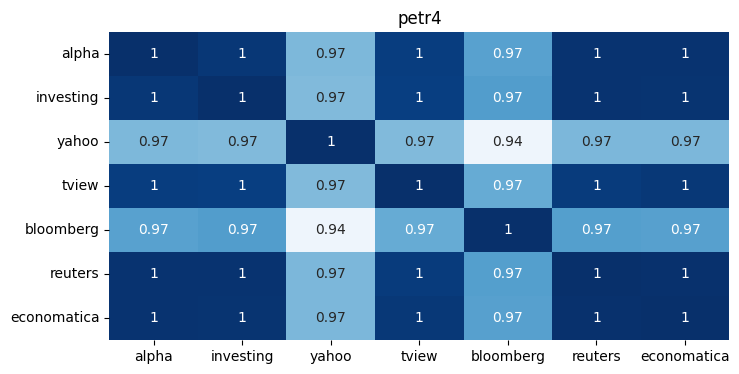

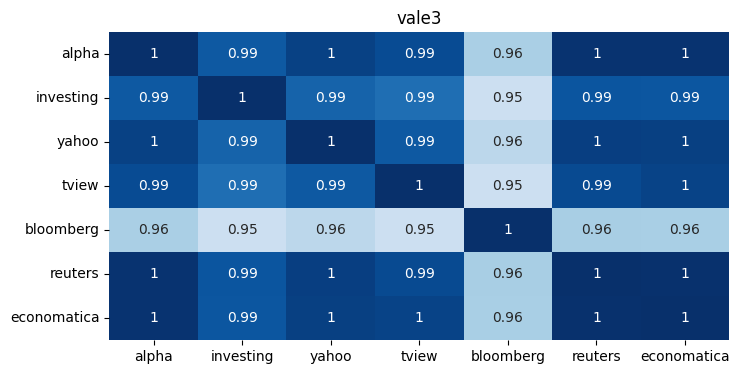

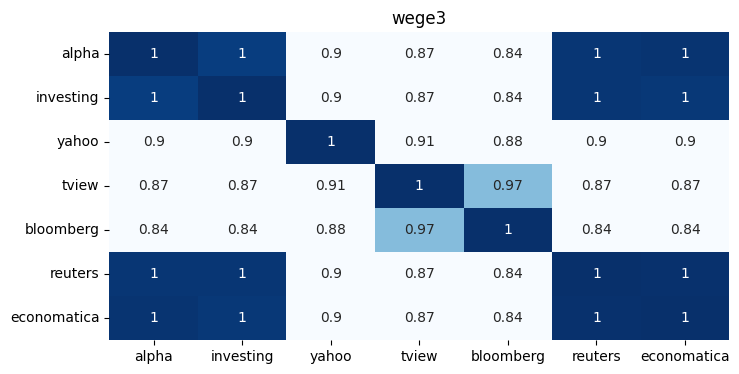

In [13]:
for ativo in ativos:
  plt.figure(figsize=(8,4))
  ax = plt.axes()
  ax.set_title(ativo)
  sns.heatmap(retornos[ativo].corr(), cmap='Blues', annot=True, ax=ax, cbar=False, vmin=0.94)

### 4.2 Séries Ajustadas

In [14]:
def ajustar_serie(df):
  df_ajustado = pd.DataFrame(index=df.index, columns=df.columns)
  df_ajustado = (1 + df.pct_change()).cumprod()
  df_ajustado.iloc[0] = 1.0
  df_ajustado.fillna(method="ffill", inplace=True)
  return df_ajustado

series_ajustadas = {ativo:ajustar_serie(precos[ativo]) for ativo in ativos}

<ipython-input-14-654d1e947beb>:3: FutureWarning:

The default fill_method='pad' in DataFrame.pct_change is deprecated and will be removed in a future version. Either fill in any non-leading NA values prior to calling pct_change or specify 'fill_method=None' to not fill NA values.

<ipython-input-14-654d1e947beb>:5: FutureWarning:

DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.

<ipython-input-14-654d1e947beb>:3: FutureWarning:

The default fill_method='pad' in DataFrame.pct_change is deprecated and will be removed in a future version. Either fill in any non-leading NA values prior to calling pct_change or specify 'fill_method=None' to not fill NA values.

<ipython-input-14-654d1e947beb>:5: FutureWarning:

DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.

<ipython-input-14-654d1e947beb>:3: FutureWarning:

The default fill_method='pad' in Data

In [15]:
[display(IPython.display.HTML(f"<h3>{ativo.upper()}</h3>"), series_ajustadas[ativo].head()) for ativo in ativos];

,alpha,investing,yahoo,tview,bloomberg,reuters,economatica
Date,,,,,,,
2005-01-03,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
2005-01-04,0.987746,0.986772,0.987720,0.987933,0.987715,0.987721,0.987721
2005-01-05,0.977937,0.978836,0.977917,0.978279,0.977946,0.977917,0.977917
2005-01-06,0.965684,0.965608,0.965662,0.966211,0.965660,0.965663,0.965663
2005-01-07,0.964445,0.965608,0.964437,0.964602,0.964476,0.964437,0.964437


,alpha,investing,yahoo,tview,bloomberg,reuters,economatica
Date,,,,,,,
2005-01-03,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
2005-01-04,0.988109,0.988493,0.988110,0.988360,0.988110,0.988110,0.988110
2005-01-05,0.984286,0.983890,0.984289,0.984127,0.984289,0.984289,0.984289
2005-01-06,0.987262,0.987342,0.987261,0.987302,0.987261,0.987261,0.987261
2005-01-07,0.991617,0.991945,0.991614,0.991534,0.991592,0.991614,0.991614


,alpha,investing,yahoo,tview,bloomberg,reuters,economatica
Date,,,,,,,
2005-01-03,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
2005-01-04,0.959252,0.959792,0.959252,0.959252,0.959226,0.959252,0.959252
2005-01-05,0.952574,0.953090,0.952572,0.952572,0.952546,0.952572,0.952572
2005-01-06,0.948558,0.948622,0.948564,0.948564,0.948538,0.948564,0.948564
2005-01-07,0.973941,0.973939,0.973948,0.973948,0.973922,0.973948,0.973948


,alpha,investing,yahoo,tview,bloomberg,reuters,economatica
Date,,,,,,,
2005-01-03,1.000000,1.0,1.000000,1.000000,1.000000,1.000000,1.000000
2005-02-04,1.000000,1.0,1.053595,1.055061,1.048204,1.000000,1.000000
2005-02-09,1.000000,1.0,1.053595,1.067496,1.067108,1.000000,1.000000
2005-02-16,1.007525,1.0,1.061439,1.149201,1.149338,1.007444,1.007444
2005-02-17,1.007525,1.0,1.061439,1.138543,1.137996,1.007444,1.007444


In [16]:
[series_ajustadas[ativo].iplot( title=f"{ativo.upper()} - Série Ajustada" , theme='solar') for ativo in ativos];

### 4.3 Distância Euclidiana entre séries

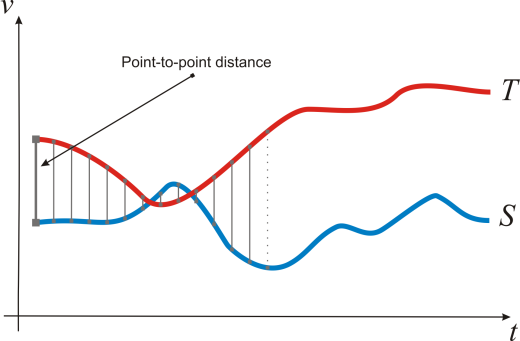

Quanto menor o valor mais "parecidas" as séries são

In [17]:
def calcula_distancias(serie):
  fontes_comb = [fonte for fonte in combinations(fontes, 2)]
  distancias = {}
  for ativo in ativos:
    distancias[ativo] = pd.DataFrame(index=fontes, columns=fontes)
    for fonte in fontes_comb:
      x = serie[ativo][fonte[0]]
      y = serie[ativo][fonte[1]]
      distancias[ativo].loc[fonte[0], fonte[1]] = (np.linalg.norm(x - y))
      distancias[ativo].loc[fonte[1], fonte[0]] = (np.linalg.norm(x - y))
      distancias[ativo] = distancias[ativo].fillna(0)

    max = distancias[ativo].max().max()
    min = distancias[ativo].min().min()
    distancias[ativo] = round((distancias[ativo] - min) / (max - min), 2)

  return distancias

In [18]:
distancias = calcula_distancias(series_ajustadas)

<ipython-input-17-20f8868ccbc9>:9: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '59.24593679610792' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.

<ipython-input-17-20f8868ccbc9>:9: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '401.97867270664057' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.

<ipython-input-17-20f8868ccbc9>:9: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '15.417578381078002' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.

<ipython-input-17-20f8868ccbc9>:9: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '85.12829708565302' has dtype incompatible with int64, please 

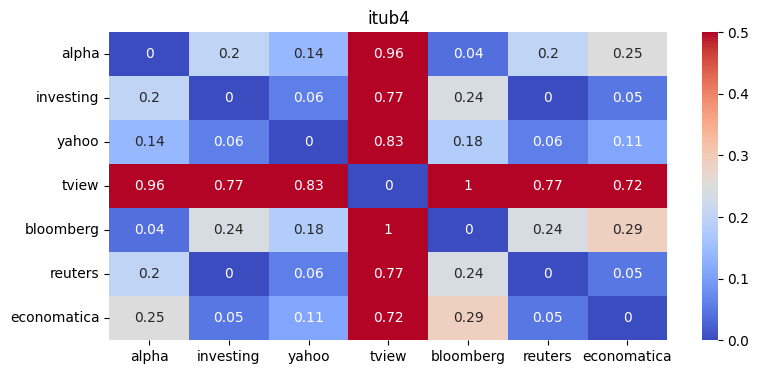

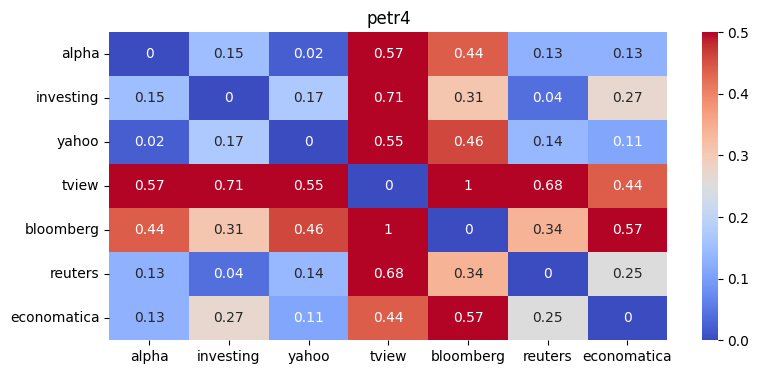

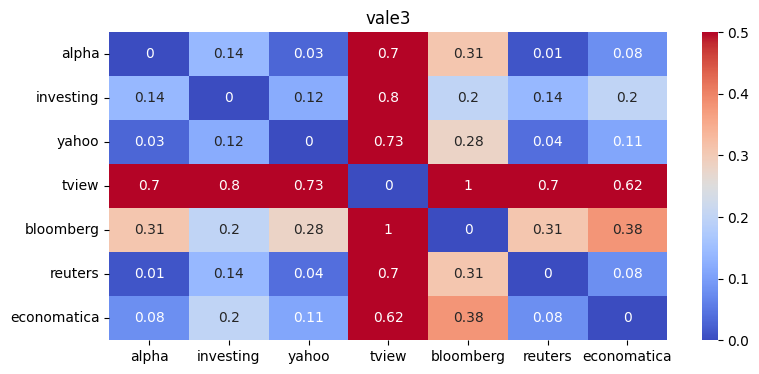

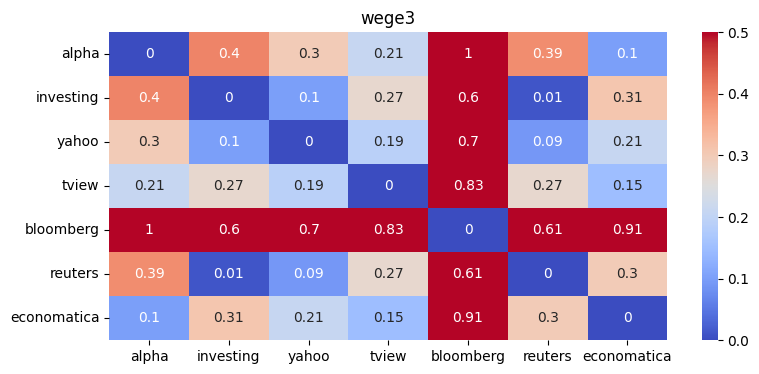

In [19]:
for ativo in ativos:
  plt.figure(figsize=(9,4))
  ax = plt.axes()
  ax.set_title(ativo)
  sns.heatmap(distancias[ativo], cmap='coolwarm', annot=True, ax=ax, vmax=0.5);